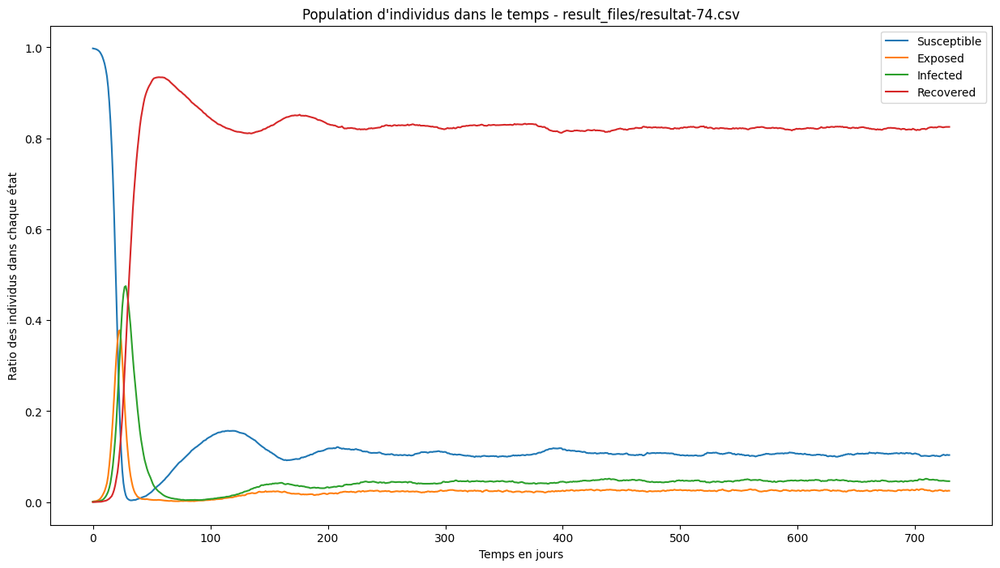

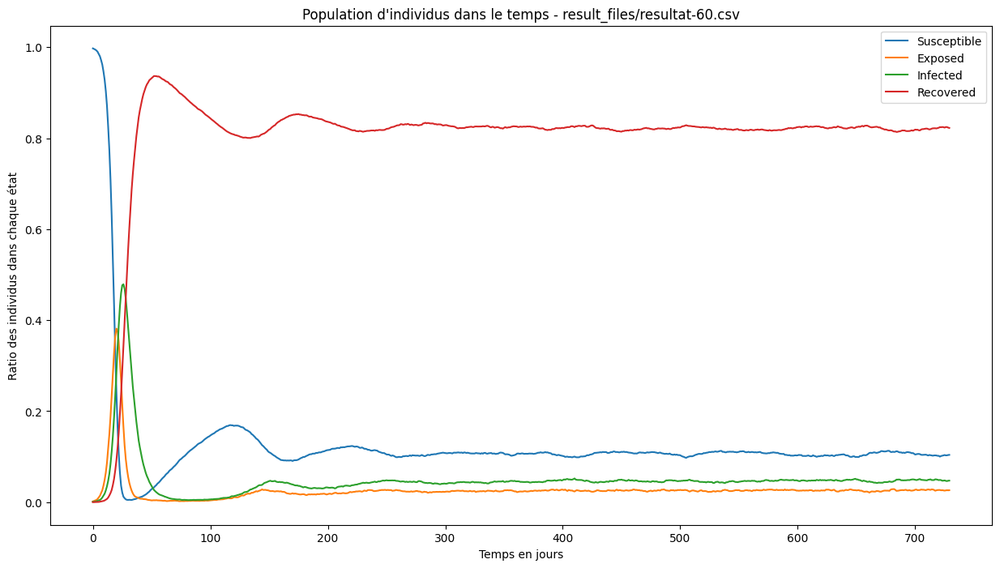

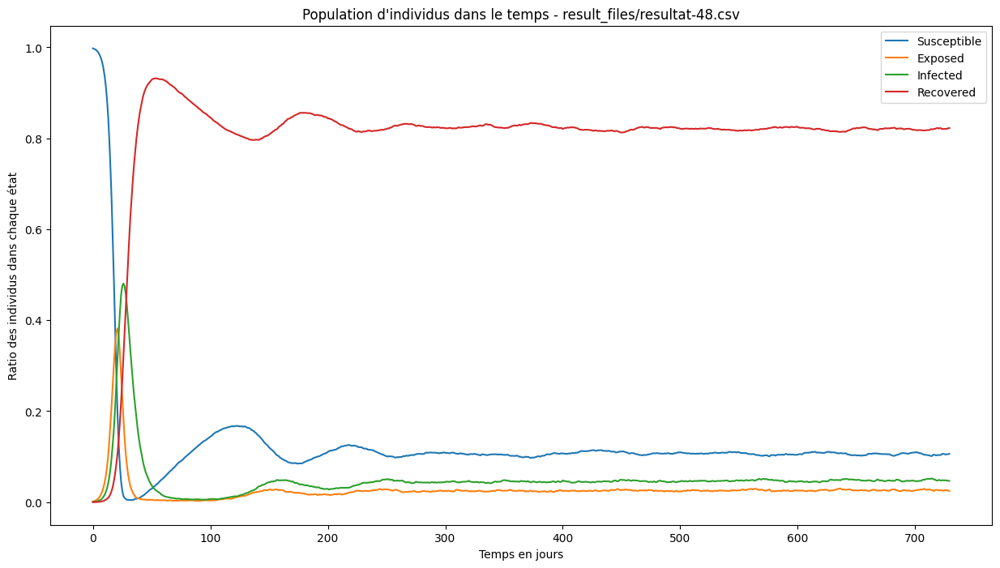

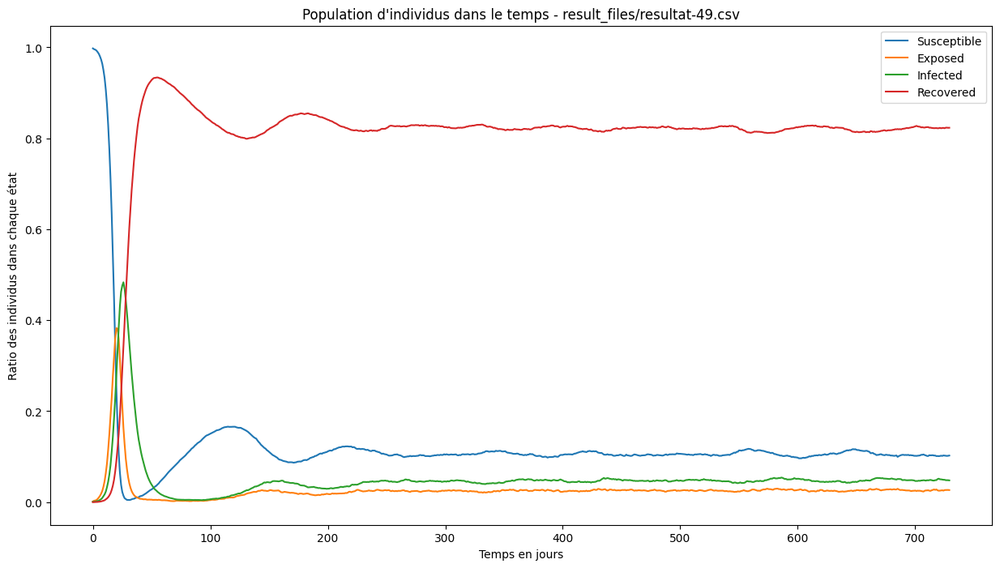

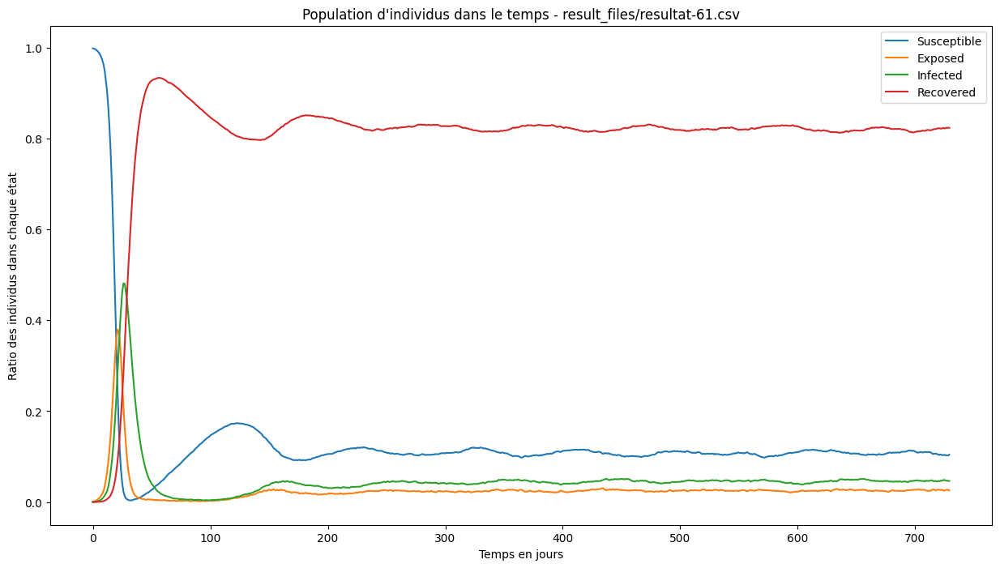

...

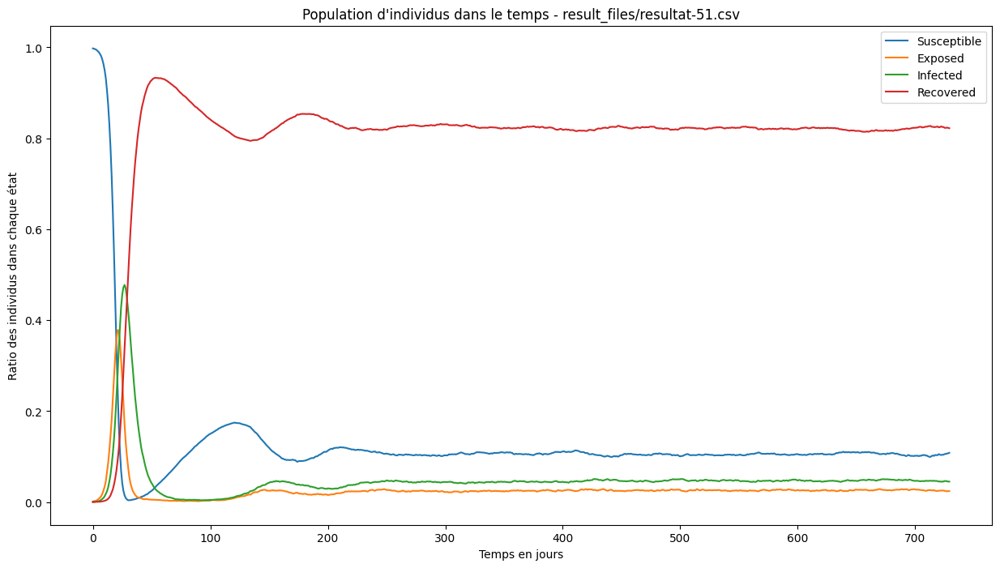

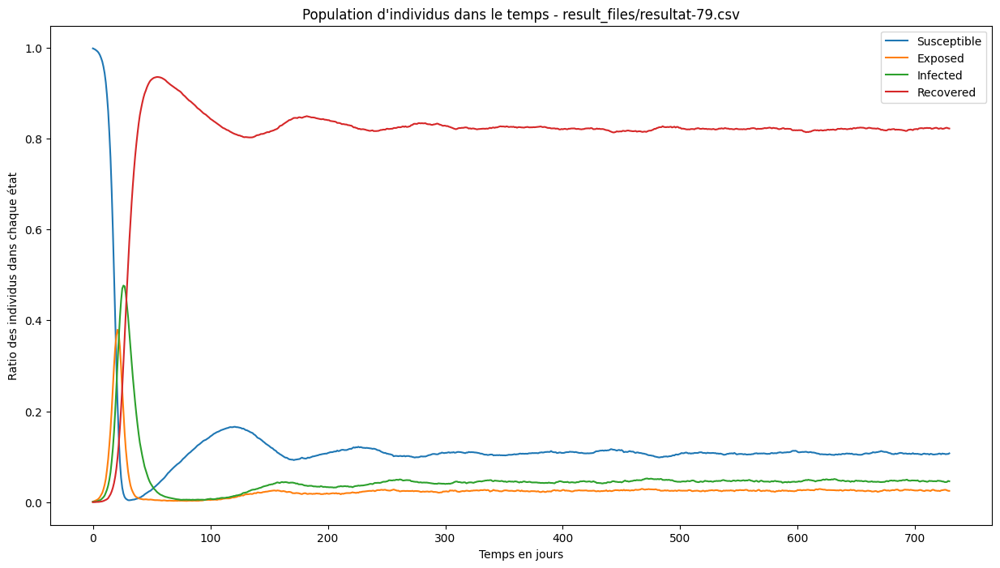

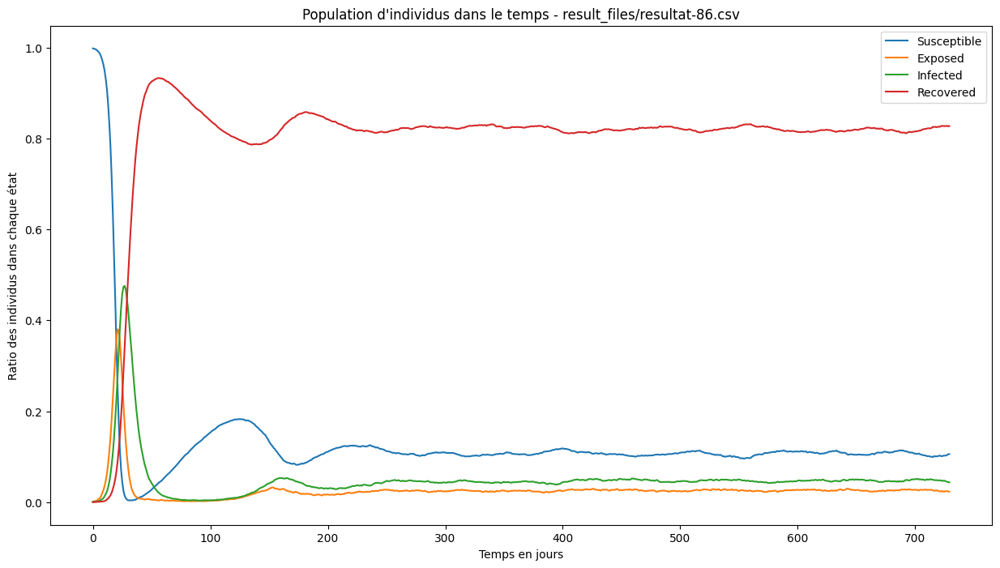

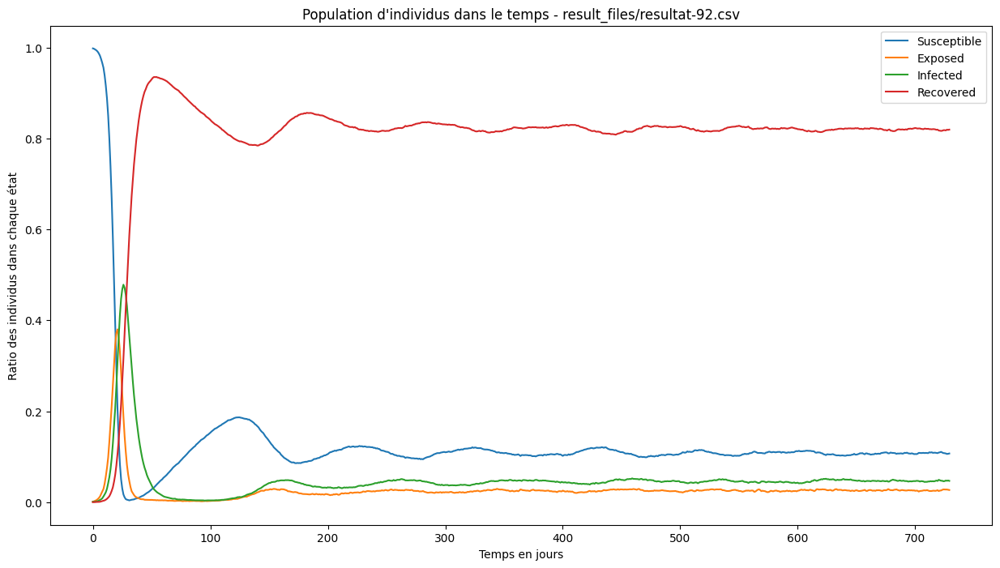

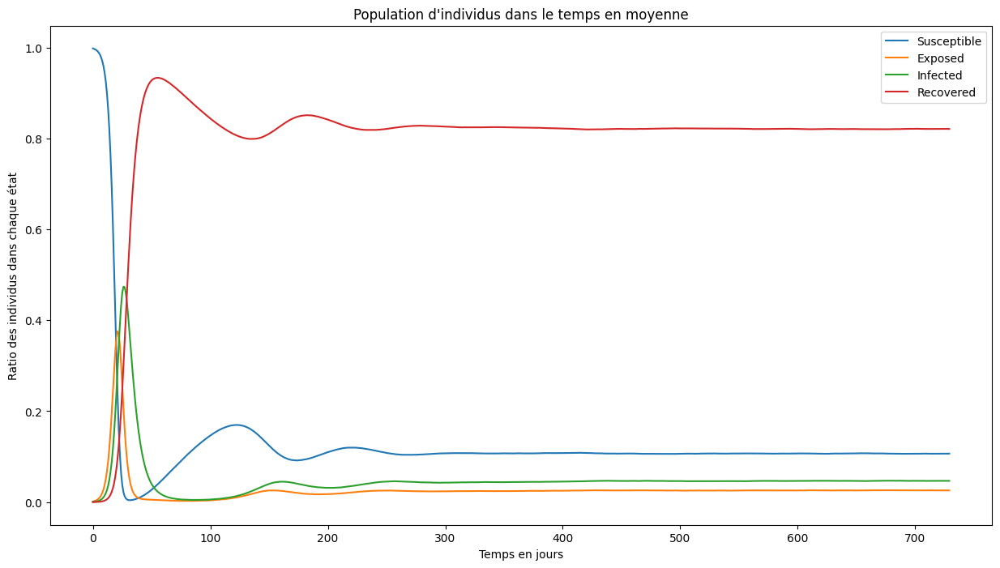

In [4]:
import pandas as pd
import os
import matplotlib.pyplot as plt

# Chemin du dossier
folder_path = 'result_files/'

# Liste pour stocker les DataFrames de chaque résultat
dfs = []

# Parcours chaque fichier dans le dossier result_files
for filename in os.listdir(folder_path):
    if filename.endswith('.csv'):
        filepath = os.path.join(folder_path, filename)
        with open(filepath, "r") as f:
            lines = f.read().splitlines()
            f.close()

            # Stockage temporaire S I E R des courbes
            S = []
            I = []
            E = []
            R = []

            for i, line in enumerate(lines):
                # Ignore la première ligne S,I,E,R
                if i != 0:  
                    elem = line.split(",")
                    # Normalisation des résultats
                    S.append(int(elem[0])/20000)
                    I.append(int(elem[1])/20000)
                    E.append(int(elem[2])/20000)
                    R.append(int(elem[3])/20000)
            # Ajoute les listes S,I,E,R et deviennent colonnes du dataframe df
            df = pd.DataFrame({'Susceptible': S, 'Infected': I, 'Exposed': E,'Recovered': R})

            # Affichage graphique des 100 réplications
            plt.figure(figsize=(15, 8))
            plt.plot(df.index, df['Susceptible'], label='Susceptible')
            plt.plot(df.index, df['Exposed'], label='Exposed')
            plt.plot(df.index, df['Infected'], label='Infected')
            plt.plot(df.index, df['Recovered'], label='Recovered')
            plt.title(f"Population d'individus dans le temps - {filepath}")
            plt.xlabel('Temps en jours')
            plt.ylabel('Ratio des individus dans chaque état')
            plt.legend()
            plt.show()

            # Ajout des dfs pour la réalisation de la moyenne
            dfs.append(df)

# Implémentation de la moyenne des réplications
df_concatene = pd.concat(dfs, axis=0)
df_moyen = df_concatene.groupby(level=0).mean()

# Affichage graphique de la courbe de la moyenne
plt.figure(figsize=(15, 8))
plt.plot(df_moyen.index, df_moyen['Susceptible'], label='Susceptible')
plt.plot(df_moyen.index, df_moyen['Exposed'], label='Exposed')
plt.plot(df_moyen.index, df_moyen['Infected'], label='Infected')
plt.plot(df_moyen.index, df_moyen['Recovered'], label='Recovered')
plt.title("Population d'individus dans le temps en moyenne")
plt.xlabel('Temps en jours')
plt.ylabel('Ratio des individus dans chaque état')
plt.legend()
plt.show()

            


 
            

